### Set-up

*Converting labels to yolo readable format can be found in main.py*

In [ ]:
#Train on GPU
import torch
print("PyTorch version:", torch.__version__)

if torch.cuda.is_available():
    device = torch.device("cuda")
    print("There are", torch.cuda.device_count(), "GPU(s) available.")
    print("Device name:", torch.cuda.get_device_name(0))
else:
    print("No GPU available, using CPU instead.")
    device = torch.device("cpu")

PyTorch version: 2.0.0+cu118
There are 1 GPU(s) available.
Device name: Tesla T4


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
%cd /content/drive/My Drive/yolo

/content/drive/My Drive/yolo


In [ ]:
#Install and import CleanML for Logging and Tracking
%pip install -q clearml
import clearml; clearml.browser_login()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 40.1 MB/s eta 0:00:00


<IPython.core.display.Javascript object>


🤖 ClearML connected successfully - let's build something! 🚀


In [4]:
%cd yolov5

/content/drive/My Drive/yolo/yolov5


In [ ]:
%pip install -qr requirements.txt 

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 17.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.6 MB/s eta 0:00:00


In [ ]:
import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-158-g8211a03 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.4/78.2 GB disk)


In [ ]:
%pwd

'/content/drive/My Drive/yolo/yolov5'

In [ ]:
#Configuration for CleanML
%env CLEARML_WEB_HOST=https://app.clear.ml
%env CLEARML_API_HOST=https://api.clear.ml
%env CLEARML_FILES_HOST=https://files.clear.ml
%env CLEARML_API_ACCESS_KEY=#Hidden
%env CLEARML_API_SECRET_KEY=#Hidden

### Model v1

In [ ]:
from clearml import Task
task = Task.init(project_name="YOLO_SL_Colab", task_name="yolo_train_v1")

In the first training, we use image size of 640 and batch of 32 in order to reduce the memory load — otherwise the environment breaks. We use medium model (yolov5m) which is a good tradeoff between accuracy, speed, and memory usage. However, because of that I increase the number of epochs to 150 to ensure the accuracy will be (at least) decent. We don't define the special hyperparameters from the config file. 

Hyperparameters used: 

lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3) 

lrf: 0.01  # final OneCycleLR learning rate (lr0 * lrf)

momentum: 0.937  # SGD momentum/Adam beta1

weight_decay: 0.0005  # optimizer weight decay 5e-4

warmup_epochs: 3.0  # warmup epochs

warmup_momentum: 0.8  # warmup initial momentum

warmup_bias_lr: 0.1  # warmup initial bias lr

box: 0.05  # box loss gain

cls: 0.5  # cls loss gain

cls_pw: 1.0  # cls BCELoss positive_weight

obj: 1.0  # obj loss gain (scale with pixels)

obj_pw: 1.0  # obj BCELoss positive_weight

iou_t: 0.20  # IoU training threshold

anchor_t: 4.0  # anchor-multiple threshold

fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)

hsv_h: 0.015  # image HSV-Hue augmentation (fraction)


hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)

hsv_v: 0.4  # image HSV-Value augmentation (fraction)

degrees: 0.0  # image rotation (+/- deg)

translate: 0.1  # image translation (+/- fraction)

scale: 0.5  # image scale (+/- gain)

shear: 0.0  # image shear (+/- deg)

perspective: 0.0  # image perspective (+/- fraction), range 0-0.001

flipud: 0.0  # image flip up-down (probability)

fliplr: 0.5  # image flip left-right (probability)

mosaic: 1.0  # image mosaic (probability)

mixup: 0.0  # image mixup (probability)

copy_paste: 0.0  # segment copy-paste (probability)

In [ ]:
!python train.py --img 640 --batch 32 --epochs 150 --data train.yaml --cfg "./models/yolov5m.yaml" --weights '' --name "v2"


train: weights=, cfg=./models/yolov5m.yaml, data=train.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=v2, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch origin' timed out after 5 seconds
requirements: /content/drive/MyDrive/yolo/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj

In [ ]:
!python detect.py --weights "runs/train/v216/weights/best.pt" --source '../val/images' --conf 0.25 --iou 0.45 --save-txt


detect: weights=['runs/train/v216/weights/best.pt'], source=../val/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/drive/MyDrive/yolo/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20856975 parameters, 0 gradients, 47.9 GFLOPs
image 1/13 /content/drive/MyDrive/yolo/val/images/06e58316-9050-48d6-b33c-8846c15581f9.jpg: 416x640 12 Clips, 5 Sleepers, 47.1ms
image 2/13 /content/drive/MyDrive/yolo/val/images/556bc5c9-b4ad-42b6-a658-b10ac0d2afb6.jpg: 416x640 12 Clips, 4 Sleepers, 20.9ms
image 3

In [ ]:
%cd yolov5

/content/drive/My Drive/yolo/yolov5


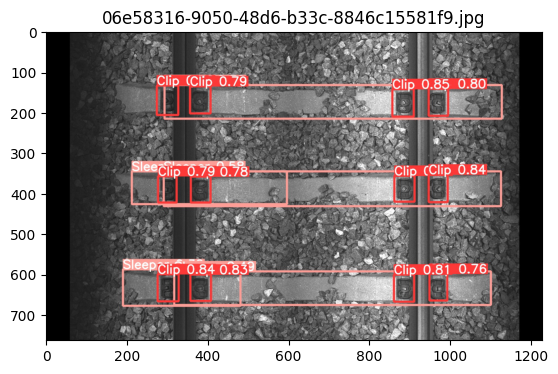

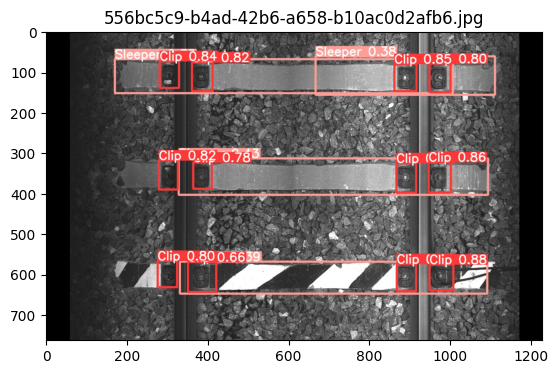

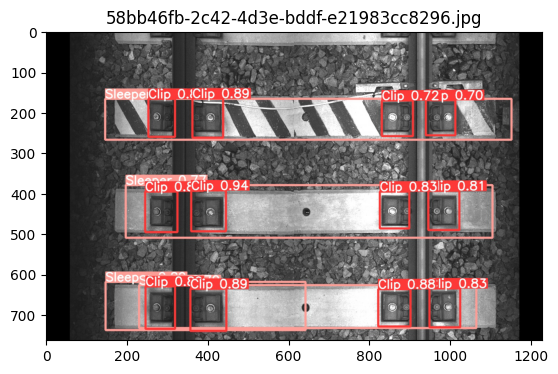

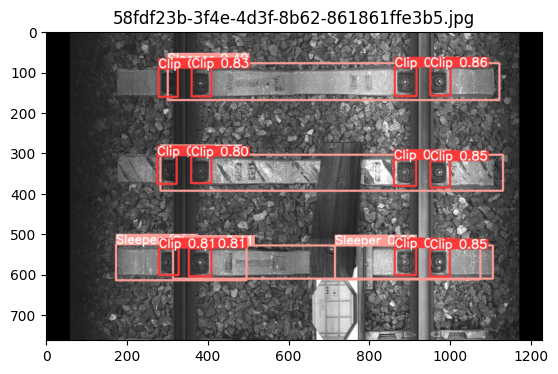

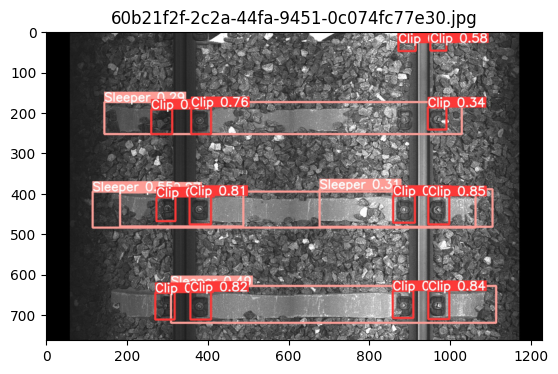

...

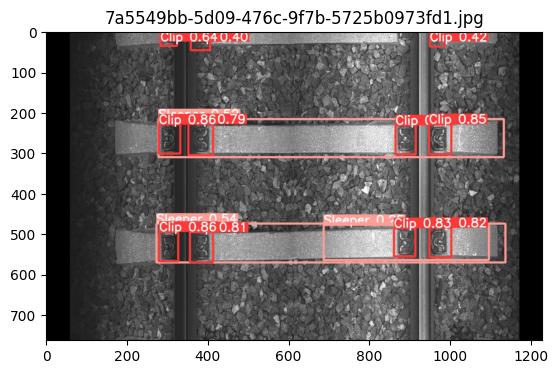

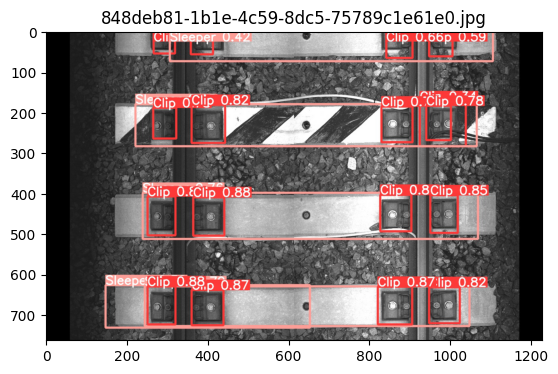

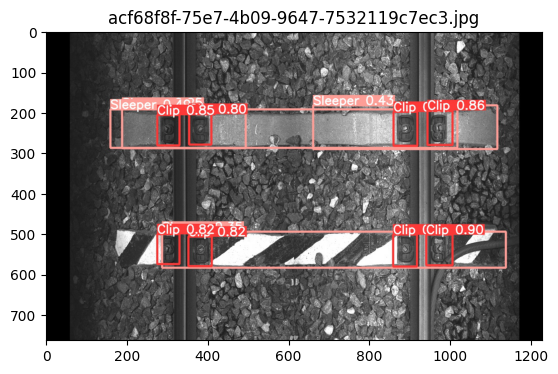

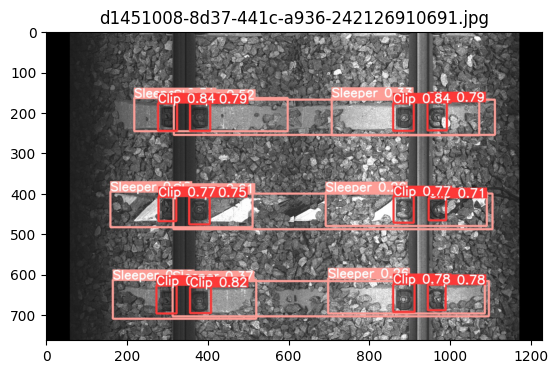

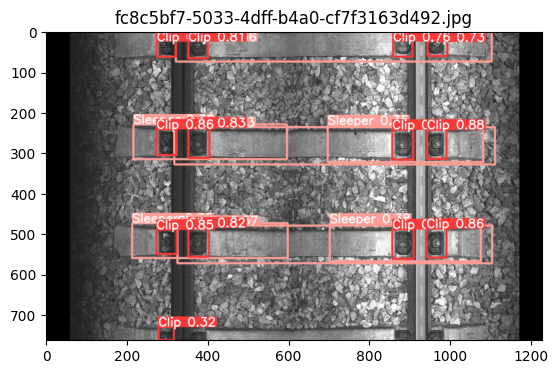

In [ ]:
import matplotlib.pyplot as plt
import os

# Define the directory where the images are stored
directory = "runs/detect/exp"

# Get a list of all the image files in the directory
image_files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f)) and f.endswith(".jpg")]

# Loop through the image files and display each one using Matplotlib
for filename in image_files:
    filepath = os.path.join(directory, filename)
    img = plt.imread(filepath)
    plt.imshow(img)
    plt.title(filename)
    plt.show()

Based on the validation images and boxes created, we can see that model is not doing a bad job. However, clips performance is much better than Sleepers. THis may also be due to much data noise inside the images when it comes to overlapping objects with sleepers (thus less precise labelling)

In [ ]:
!python val.py --data train.yaml --weights "runs/train/v216/weights/best.pt" --img 640 --conf 0.25 --iou 0.45

val: data=train.yaml, weights=['runs/train/v216/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.25, iou_thres=0.45, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
requirements: /content/drive/MyDrive/yolo/requirements.txt not found, check failed.
WARNING ⚠️ confidence threshold 0.25 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20856975 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning /content/drive/MyDrive/yolo/val/labels.cache... 13 images, 0 backgrounds, 0 corrupt: 100% 13/13 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 1/1 [00:02<00:00,  2.37s/it]
                   all         13        184      0.891      

In [ ]:
import numpy as np
# Assume we have the evaluation metrics stored in variables `p`, `r`, `mAP`, and `mAP_50_95`
p = 0.89
r = 0.91
mAP = 0.94
mAP_50_95 = 0.58

# Calculate the fitness value of the predictions using the `fitness()` function
w = [0.0, 0.0, 0.1, 0.9]  # weights for [P, R, mAP@0.5, mAP@0.5:0.95] 
fitness_value = (np.array([p, r, mAP, mAP_50_95]) * w).sum()

# Print the fitness value
print(fitness_value)

0.616


### Interpretation of Results — Model v1

**Precision: 0.897** - on average, 89.7% of the predicted bounding boxes contain objects of interest (true positives). The higher the precision, the fewer false positives there are.

**Recall: 0.905** - on average, the model is able to detect 90.5% of the objects of interest (true positives) present in the images. The higher the recall, the fewer false negatives there are.

**mAP50: 0.939** - mean Average Precision (mAP) at an Intersection over Union (IoU) threshold of 0.5. A higher mAP50 means the model is more accurate in detecting objects and localizing them with at least a 50% overlap with the ground truth bounding boxes.

**mAP50-95: 0.554** - Mean Average Precision (mAP) calculated over multiple IoU thresholds ranging from 0.5 to 0.95 with a step of 0.05. This metric provides a more comprehensive view of the model's performance across various IoU thresholds.

Overall, the model's performance seems quite good, especially considering the small size of the training dataset. The mAP50 value is quite high, indicating that the model is accurate in detecting objects with at least 50% overlap with ground truth bounding boxes. The mAP50-95 value is lower, which is expected, as it's more challenging for the model to achieve higher overlaps at stricter IoU thresholds. However, a mAP50-95 value of 0.554 *should* still considered decent, given the circumstances.

Further fine-tunining the model, augmenting the dataset, or trying different hyperparameters to improve the performance, especially for the mAP50-95 metric — this is what I will be considering in the experiments.

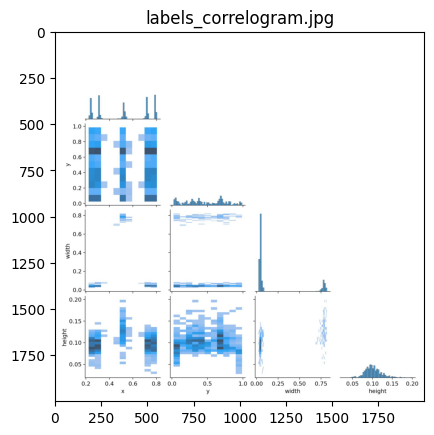

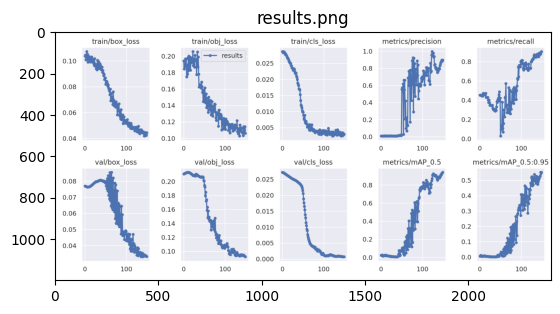

In [ ]:
# Define the directory where the images are stored
directory = "runs/train/v216/"
files=["labels_correlogram.jpg","results.png" ]
# Get a list of all the image files in the directory
image_files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f)) and f in files]

# Loop through the image files and display each one using Matplotlib
for filename in image_files:
    filepath = os.path.join(directory, filename)
    img = plt.imread(filepath)
    plt.imshow(img)
    plt.title(filename)
    plt.show()

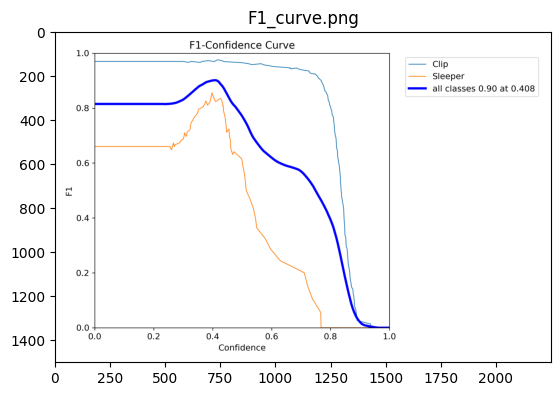

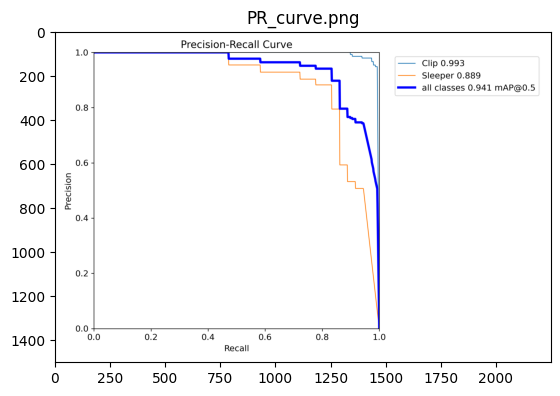

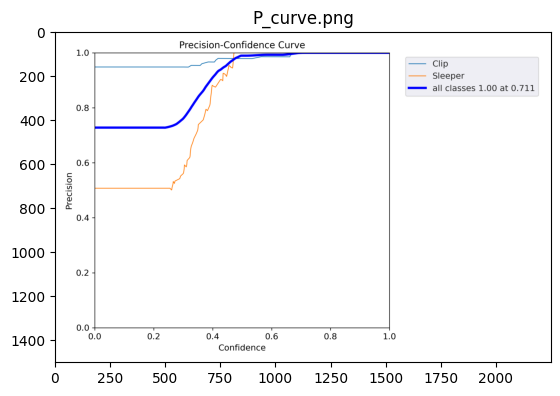

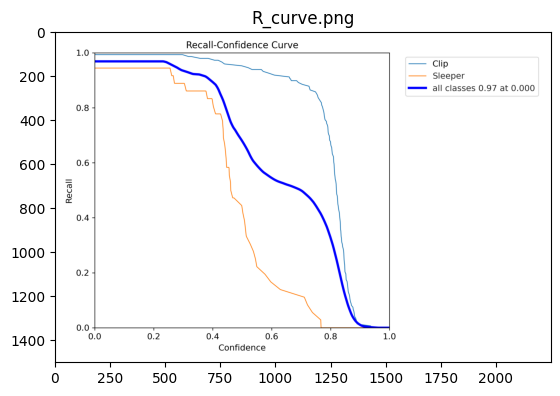

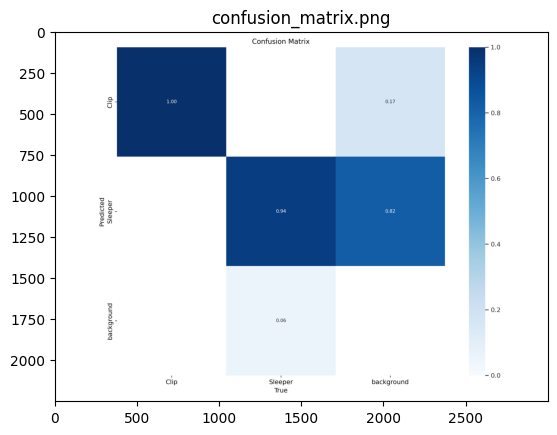

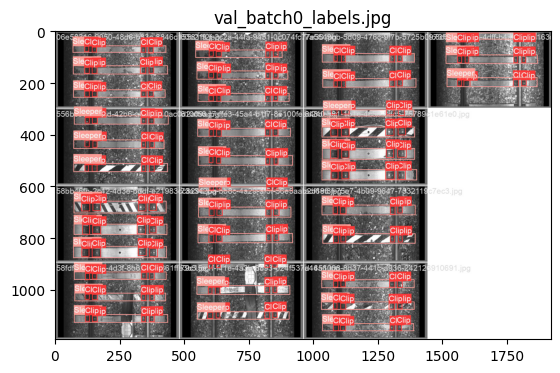

In [ ]:
# Define the directory where the images are stored
directory = "runs/val/exp"

# Get a list of all the image files in the directory
image_files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f)) ]

# Loop through the image files and display each one using Matplotlib
for filename in image_files:
    filepath = os.path.join(directory, filename)
    img = plt.imread(filepath)
    plt.imshow(img)
    plt.title(filename)
    plt.show()

#### Interpretation of Results — model v1 (cont.)

**F1 Confidence Curve:** This curve shows the F1-score (harmonic mean of precision and recall) at different confidence thresholds. 
- Results: The F1-score is stable, ranging from 0.8 to 0.4 confidence threshold, and then drops significantly to 0.0 near 1.0 confidence. This suggests that the model performs well in the low to medium confidence range but faces difficulty in maintaining a balance between precision and recall at very high confidence thresholds. 
- Possible solution: fine-tunining the model or adjusting the confidence threshold for better overall performance.

**PR Curve:** shows the relationship between precision and recall for different confidence thresholds.
- Results: The model exhibits excellent performance, achieving a precision of 1.0 for recall values up to 0.8 confidence threshold. However, there is a sudden drop in precision to 0.8 at 0.9 confidence threshold and 0.0 at 1.0 confidence threshold

**Precision Confidence Curve:**  shows the precision at different confidence thresholds. 
- Results: The precision starts at 0.75 for a confidence threshold of 0.0 and reaches 1.0 at a 0.5 confidence threshold, where it remains stable until the end of confidence values. This indicates that the model is highly accurate when it is confident about the result


**Recall Confidence Curve:**  shows the recall at different confidence thresholds. 
- Results: The recall starts at 0.98 for a confidence threshold of 0.0 and drops steadily to 0.0 at a confidence threshold of 1.0. This suggests that the model captures most true positives at low to medium confidence thresholds but starts missing them as the confidence threshold increases.

**In almost all metrics and graphs, Sleepers detection achieves worse results and Clips**

Possible improvements: :


* Increasing the size of the dataset: in our case, data augmentation is the only possibilty
* Experimenting with different model architectures: e.g. yolov5s or yolov5l to see if they provide better results for your specific task.
* Fine-tunining the model or adjusting the hyperparameters of the model, such as the learning rate, image size, data augmentation parameters or experimenting with different confidence thresholds to find the best balance between precision and recall to improve the model's performance.

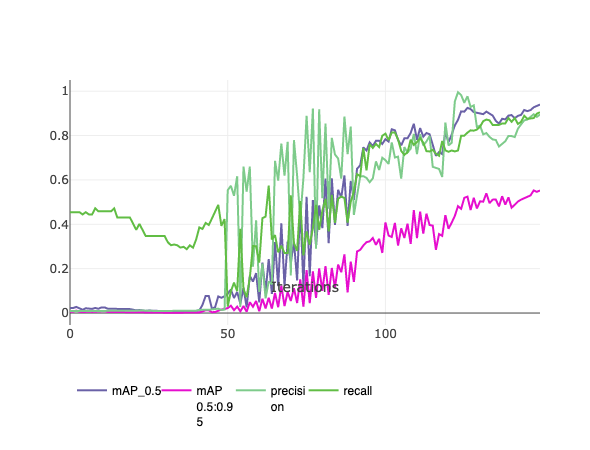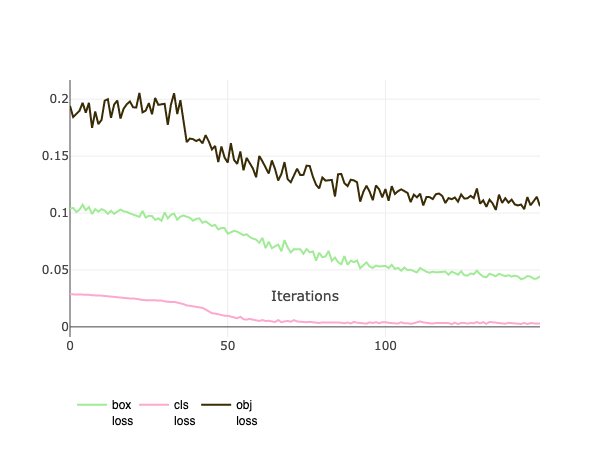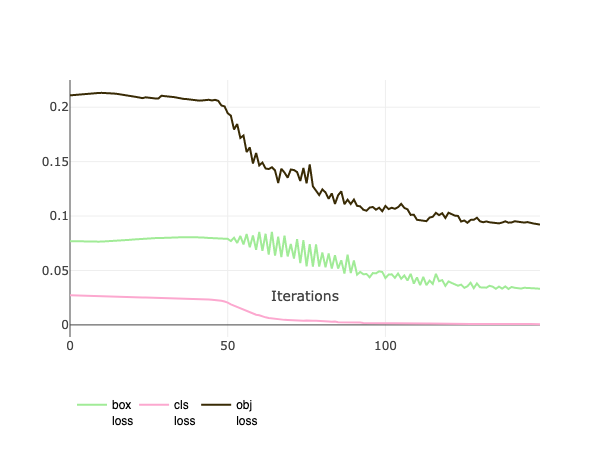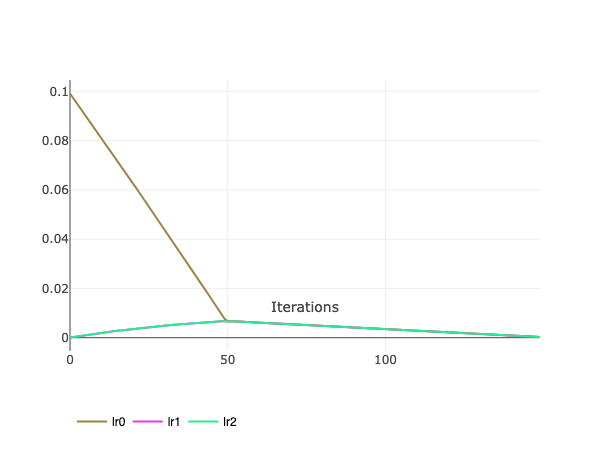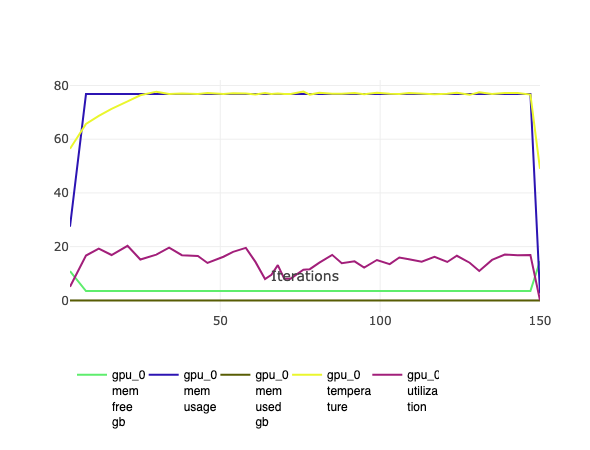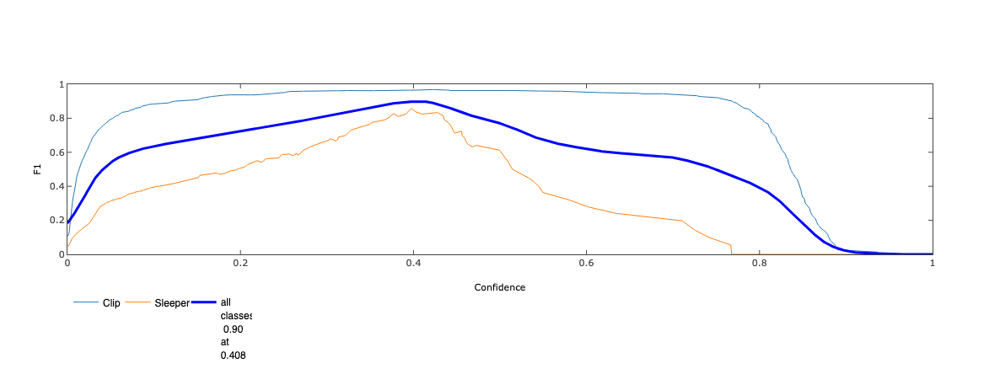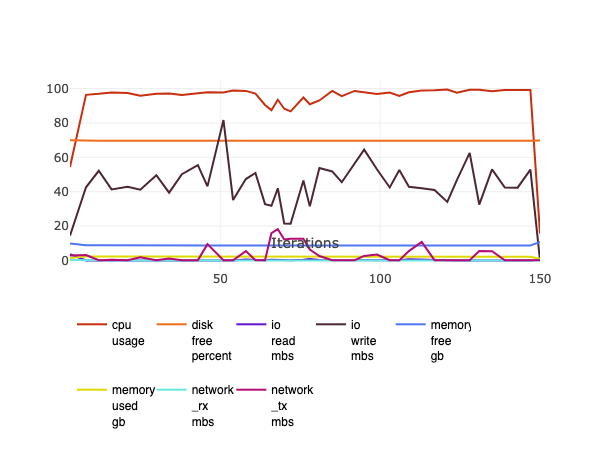

Precision starts to increase quite early but also it's very unstable, especially during first 100 epochs. Recal and mAP_0.5 exhibit more stable growth. THe slowest grows is seen for mAP 0.5:0.95 . Th real improvement for it is really seen after around 85 epochs. However, we can see that performance is stil improving so increasing number of epchos while preserving paramteres and hyperparameteres can yield better results.

### Model — v2

The Second training will be dedicated to preserve the hyperparameters but increasing the epochs count so that we further increase the precision which had an increasing trend during the end of the last training process — additional 65 epochs should allow for achieving a good score.

In [ ]:
from clearml import Task
task.close()
task = Task.init(project_name="YOLO_SL_Colab", task_name="yolo_train_v2")

ClearML Task: created new task id=8b77527018a346f19c0a59fb6861c076
ClearML results page: https://app.clear.ml/projects/dc92712157834714a718b2a99d98c945/experiments/8b77527018a346f19c0a59fb6861c076/output/log


In [ ]:
!python train.py --img 640 --batch 32 --epochs 215 --data train.yaml --cfg "./models/yolov5m.yaml" --weights '' --name "v3"

train: weights=, cfg=./models/yolov5m.yaml, data=train.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=215, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=v3, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 2 commits. Use 'git pull' or 'git clone https://github.com/ultralytics/yolov5' to update.
requirements: /content/drive/MyDrive/yolo/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_mome

In [ ]:
import numpy as np
# Assume we have the evaluation metrics stored in variables `p`, `r`, `mAP`, and `mAP_50_95`
p = 0.99
r = 0.94
mAP = 0.99
mAP_50_95 = 0.64

# Calculate the fitness value of the predictions using the `fitness()` function
w = [0.0, 0.0, 0.1, 0.9]  # weights for [P, R, mAP@0.5, mAP@0.5:0.95] 
fitness_value = (np.array([p, r, mAP, mAP_50_95]) * w).sum()

# Print the fitness value
print(fitness_value)

0.675


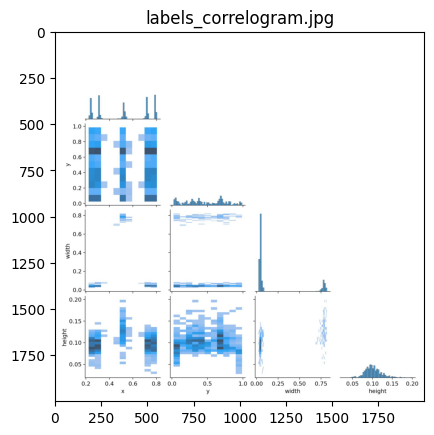

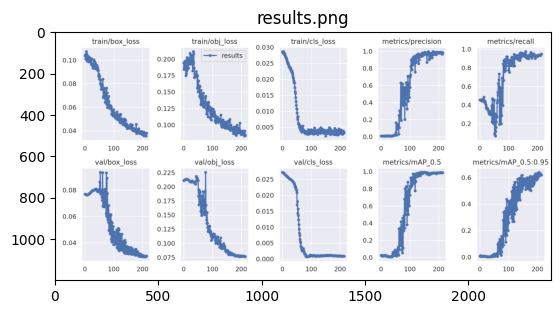

In [ ]:
# Define the directory where the images are stored
directory = "runs/train/v3/"
files=["labels_correlogram.jpg","results.png" ]
# Get a list of all the image files in the directory
image_files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f)) and f in files]

# Loop through the image files and display each one using Matplotlib
for filename in image_files:
    filepath = os.path.join(directory, filename)
    img = plt.imread(filepath)
    plt.imshow(img)
    plt.title(filename)
    plt.show()

In [ ]:
!python detect.py --weights "runs/train/v3/weights/best.pt" --source '../val/images' --conf 0.25 --iou 0.45 --save-txt

detect: weights=['runs/train/v3/weights/best.pt'], source=../val/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/drive/MyDrive/yolo/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20856975 parameters, 0 gradients, 47.9 GFLOPs
image 1/13 /content/drive/MyDrive/yolo/val/images/06e58316-9050-48d6-b33c-8846c15581f9.jpg: 416x640 12 Clips, 3 Sleepers, 66.6ms
image 2/13 /content/drive/MyDrive/yolo/val/images/556bc5c9-b4ad-42b6-a658-b10ac0d2afb6.jpg: 416x640 12 Clips, 3 Sleepers, 20.9ms
image 3/1

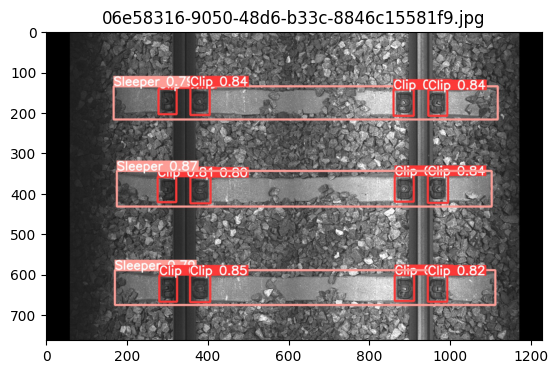

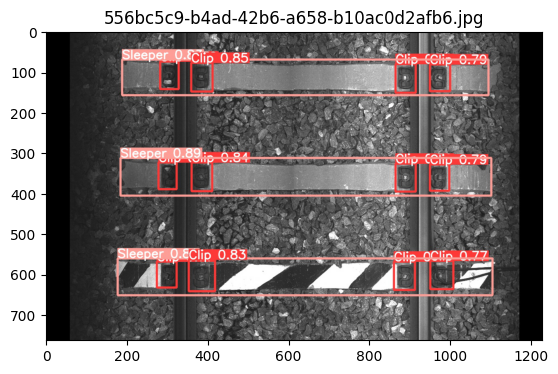

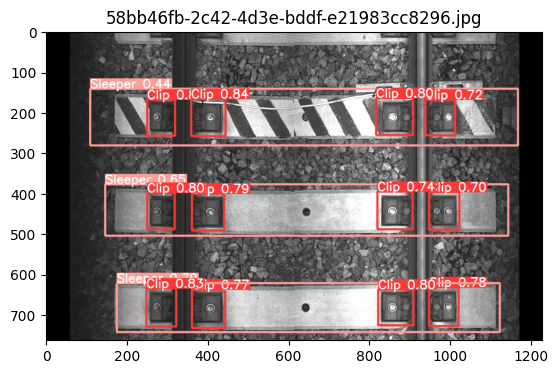

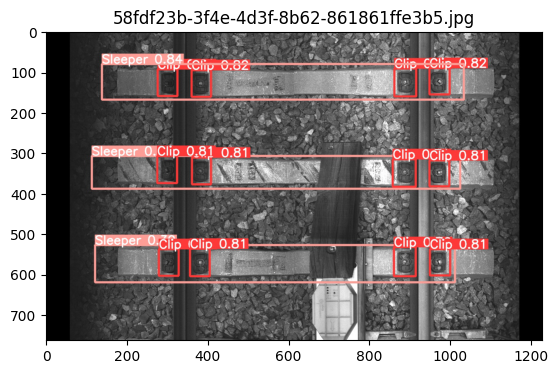

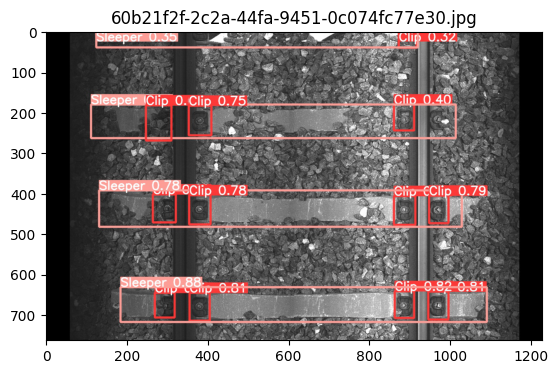

...

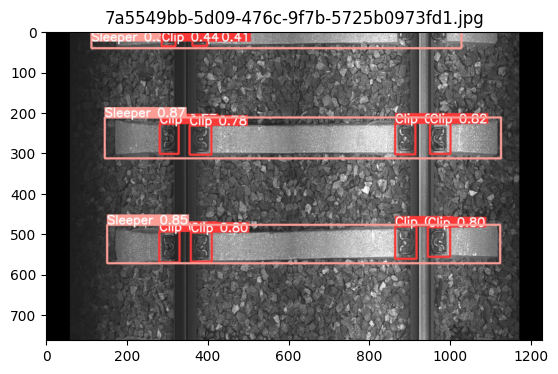

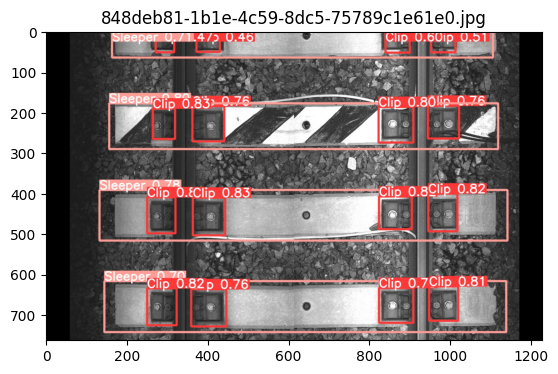

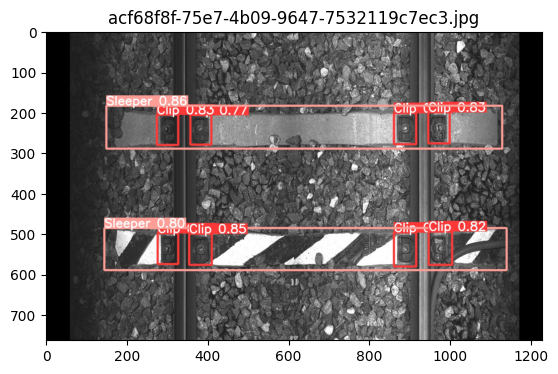

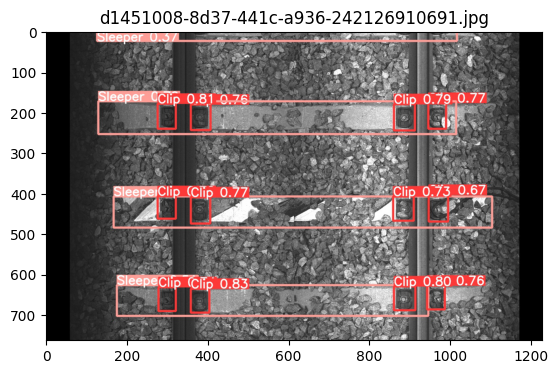

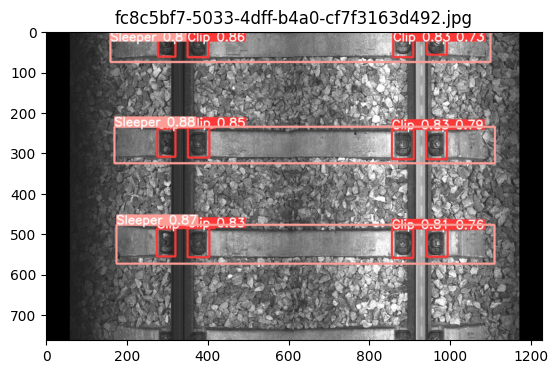

In [ ]:
# Define the directory where the images are stored
directory = "runs/detect/exp2"

# Get a list of all the image files in the directory
image_files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f)) and f.endswith(".jpg")]

# Loop through the image files and display each one using Matplotlib
for filename in image_files:
    filepath = os.path.join(directory, filename)
    img = plt.imread(filepath)
    plt.imshow(img)
    plt.title(filename)
    plt.show()

In [ ]:
!python val.py --data train.yaml --weights "runs/train/v3/weights/best.pt" --img 640 --conf 0.25 --iou 0.45

val: data=train.yaml, weights=['runs/train/v3/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.25, iou_thres=0.45, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
requirements: /content/drive/MyDrive/yolo/requirements.txt not found, check failed.
WARNING ⚠️ confidence threshold 0.25 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20856975 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning /content/drive/MyDrive/yolo/val/labels.cache... 13 images, 0 backgrounds, 0 corrupt: 100% 13/13 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 1/1 [00:01<00:00,  1.78s/it]
                   all         13        184      0.988      0.

In [ ]:
task.close()

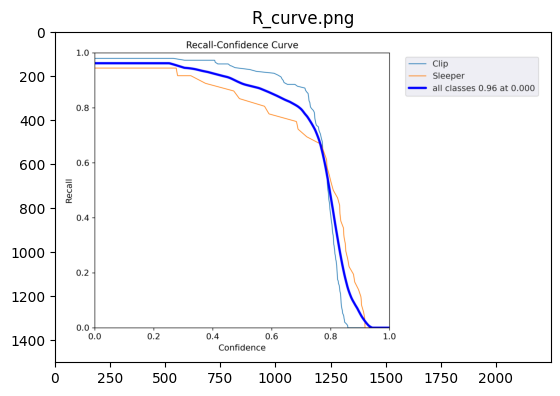

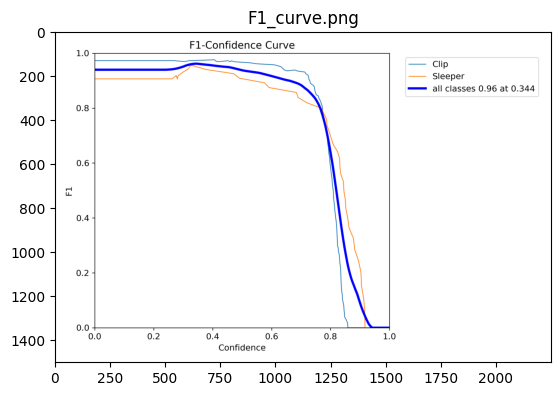

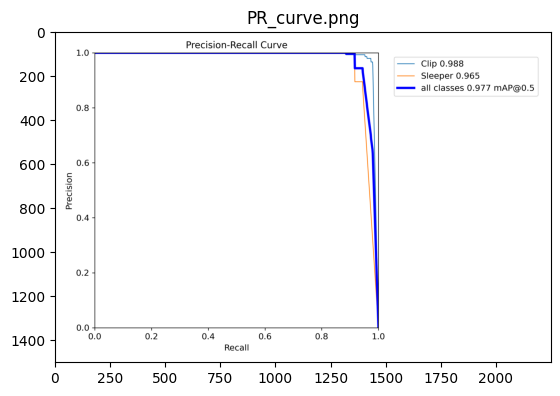

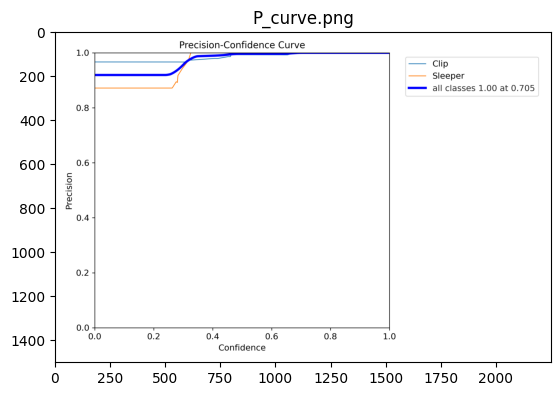

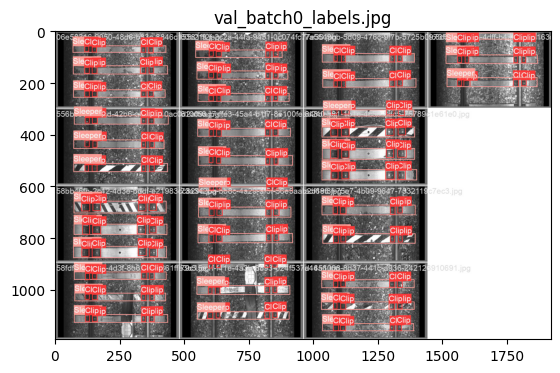

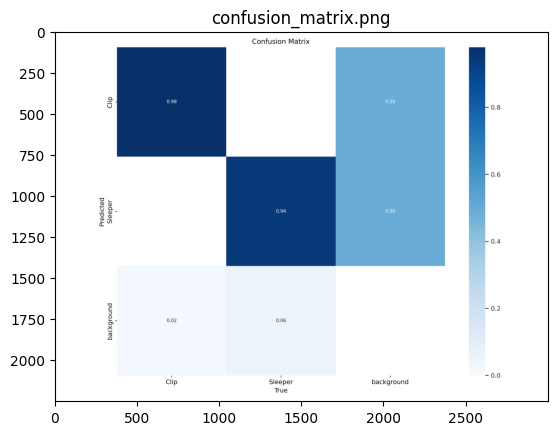

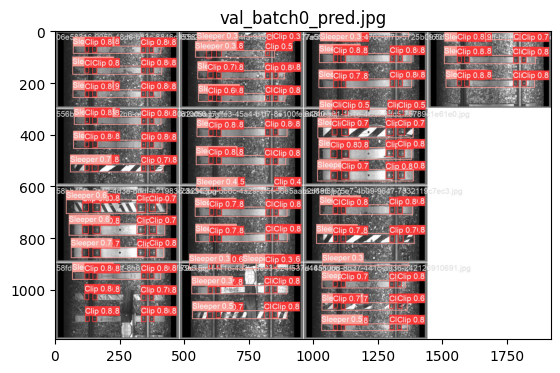

In [ ]:
# Define the directory where the images are stored
directory = "runs/val/exp2"

# Get a list of all the image files in the directory
image_files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f)) ]

# Loop through the image files and display each one using Matplotlib
for filename in image_files:
    filepath = os.path.join(directory, filename)
    img = plt.imread(filepath)
    plt.imshow(img)
    plt.title(filename)
    plt.show()

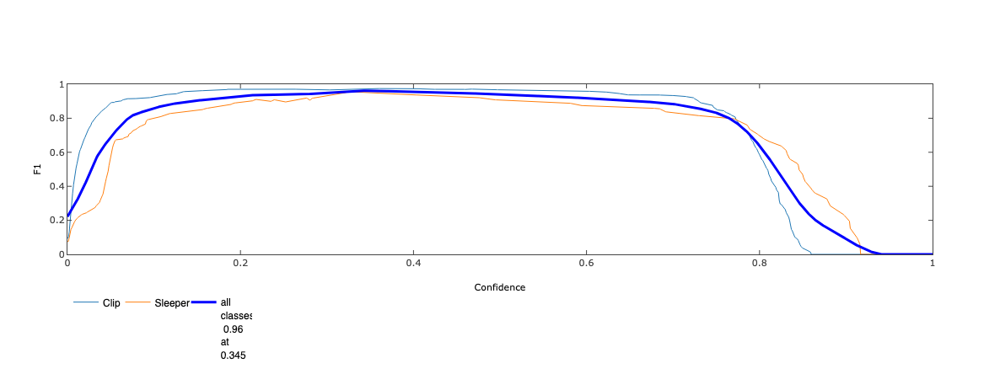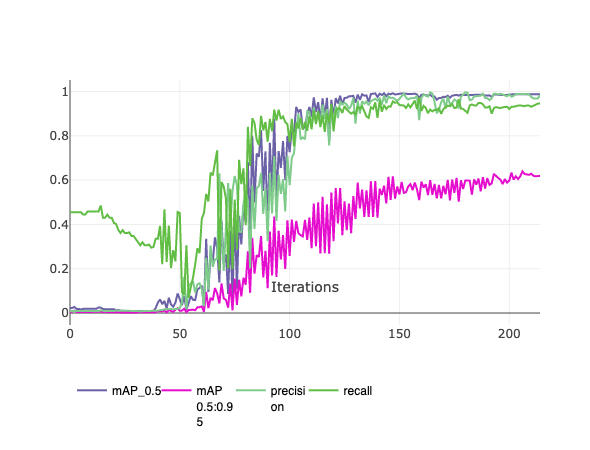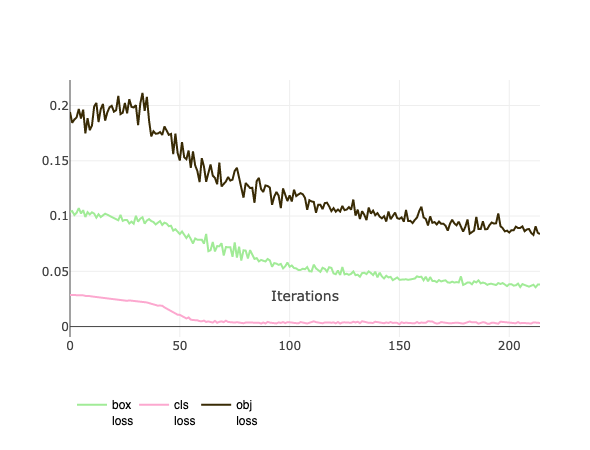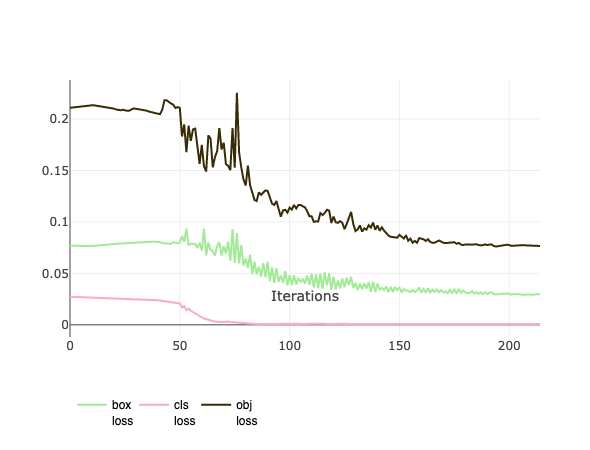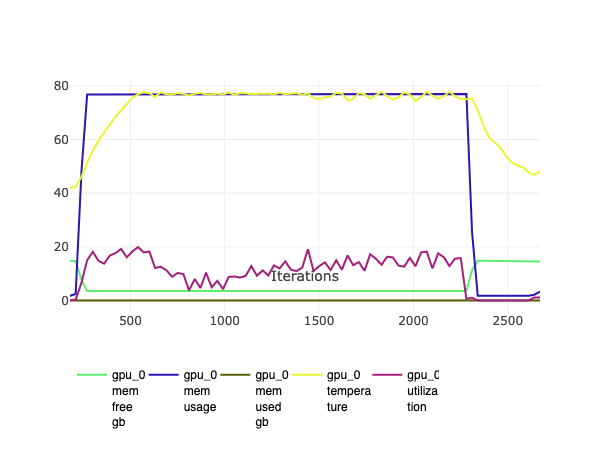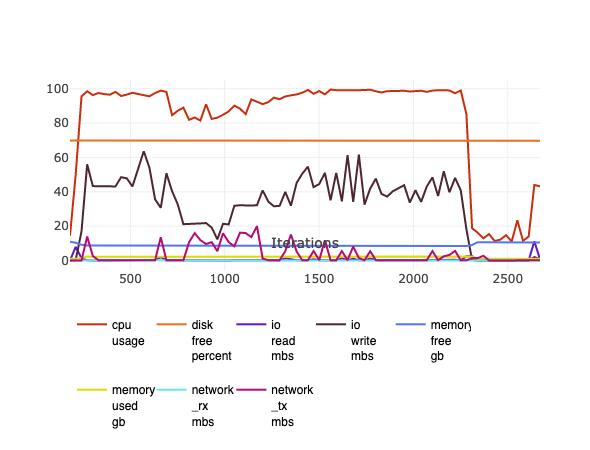

### Interpretation of the Results — model v2

Overall performance of the model (as measured by all metrics) has been improving in comparison to the first version of the model. However, we can see that there is a plateau after around 165 epochs. We should right now focus on improving especially mAP0.5:0.95 — I am going to increase the image size, reduce the number of epochs to 175 to stop before a plateau but also will decrease the batch size becuase of the memory constrains. Hyperparameteres stay the same.

### Model — v3

In [ ]:
from clearml import Task
task = Task.init(project_name="YOLO_SL_Colab", task_name="yolo_train_v3")

ClearML Task: created new task id=54a7354f23ff440c956f76a170dc5533


ClearML results page: https://app.clear.ml/projects/dc92712157834714a718b2a99d98c945/experiments/54a7354f23ff440c956f76a170dc5533/output/log


In [ ]:
!python train.py --img 768 --batch 16 --epochs 175 --data train.yaml --cfg "./models/yolov5m.yaml" --weights '' --name "v4"

train: weights=, cfg=./models/yolov5m.yaml, data=train.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=175, batch_size=16, imgsz=768, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=v4, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 2 commits. Use 'git pull' or 'git clone https://github.com/ultralytics/yolov5' to update.
requirements: /content/drive/MyDrive/yolo/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_mome

In [ ]:
task.close()

2023-05-01 22:28:35,255 - clearml.Task - INFO - Waiting for repository detection and full package requirement analysis
2023-05-01 22:29:24,922 - clearml.Task - INFO - Storing jupyter notebook directly as code


In [5]:
!python val.py --data train.yaml --weights "runs/train/v42/weights/best.pt" --img 768 --conf 0.25 --iou 0.45

val: data=train.yaml, weights=['runs/train/v42/weights/best.pt'], batch_size=32, imgsz=768, conf_thres=0.25, iou_thres=0.45, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
requirements: /content/drive/My Drive/yolo/requirements.txt not found, check failed.
WARNING ⚠️ confidence threshold 0.25 > 0.001 produces invalid results
fatal: cannot change to '/content/drive/My': No such file or directory
YOLOv5 🚀 2023-5-1 Python-3.10.11 torch-2.0.0+cu118 CPU

Fusing layers... 
YOLOv5m summary: 212 layers, 20856975 parameters, 0 gradients
100% 755k/755k [00:00<00:00, 16.2MB/s]
val: Scanning /content/drive/My Drive/yolo/val/labels... 13 images, 0 backgrounds, 0 corrupt: 100% 13/13 [00:05<00:00,  2.51it/s]
val: New cache created: /content/drive/My Drive/yolo/val/labels.cache
                 Class     Images  Instances    

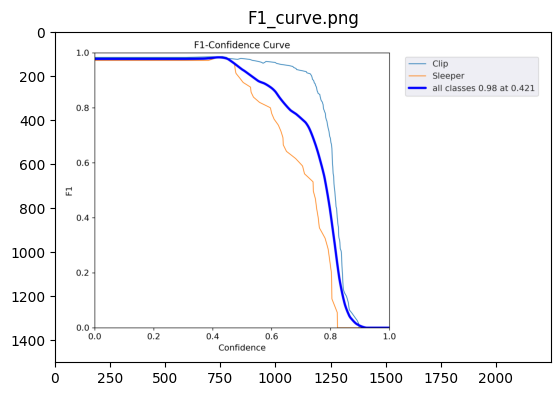

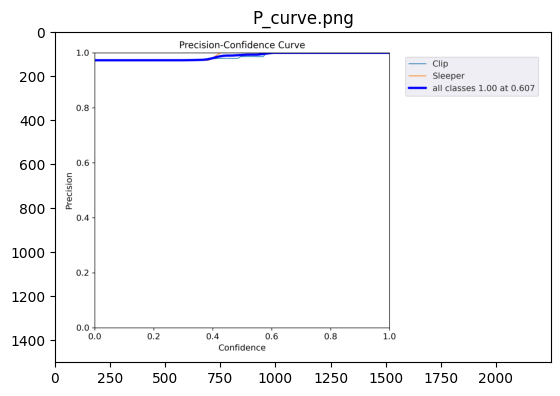

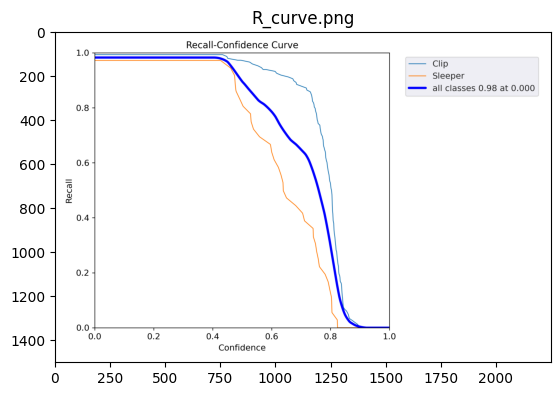

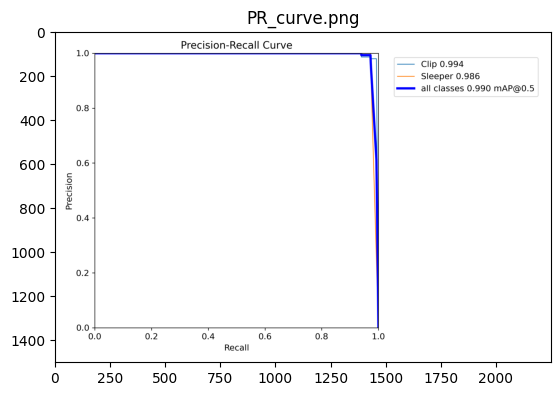

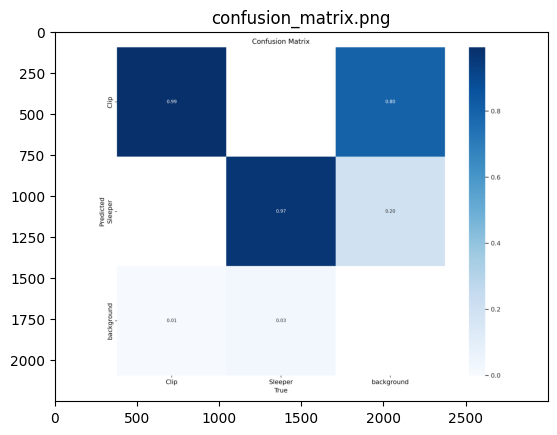

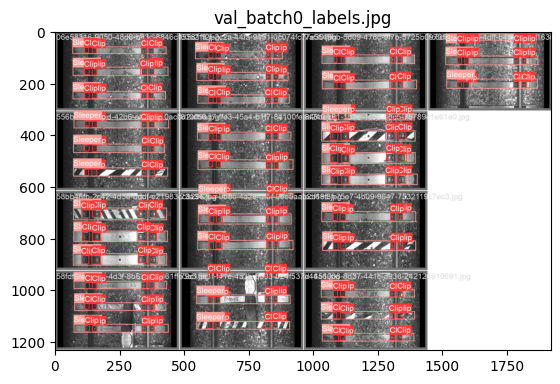

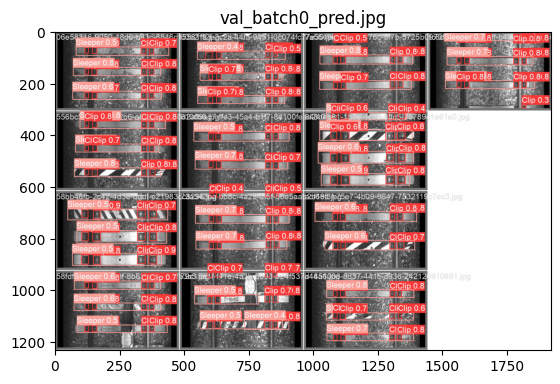

In [9]:
import os
import matplotlib.pyplot as plt
# Define the directory where the images are stored
directory = "runs/val/exp3"

# Get a list of all the image files in the directory
image_files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f)) ]

# Loop through the image files and display each one using Matplotlib
for filename in image_files:
    filepath = os.path.join(directory, filename)
    img = plt.imread(filepath)
    plt.imshow(img)
    plt.title(filename)
    plt.show()

### Interpretation of the Results — Model v3

We don't see much improvement when it comes to general scores. However, increasing image size, in my opinion, helped to reduce the gap between performance of Sleepers and Clips. My last attempt would be to try the same image size, epochs, and batch size but with different learning rate (increased and cls loss gain paramter).

Please, refer to **main2.ipynb** file for the next training process — this is due to the problems with environment in this notebook.